Calculate the Bayes Factor for $M_r$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [13]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [14]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [15]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'nsa_v1_0_1_VAGC_vflag-V2_sys_(1).fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [16]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [17]:
rabsmag_NSA = np.array(catalog_main['ELPETRO_ABSMAG'][:,4])

# Separate galaxies by their $V^2$ LSS classifications

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

In [18]:
wall_noRmin = catalog_main['vflag_V2_noRmin'] == 0
void_noRmin = catalog_main['vflag_V2_noRmin'] == 1
edge_noRmin = catalog_main['vflag_V2_noRmin'] == 2
out_noRmin = catalog_main['vflag_V2_noRmin'] == 9

## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [19]:
wall_0p1 = catalog_main['vflag_V2_0p1rho'] == 0
void_0p1 = catalog_main['vflag_V2_0p1rho'] == 1
edge_0p1 = catalog_main['vflag_V2_0p1rho'] == 2
out_0p1 = catalog_main['vflag_V2_0p1rho'] == 9

## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [20]:
wall_0p3 = catalog_main['vflag_V2_0p3rho'] == 0
void_0p3 = catalog_main['vflag_V2_0p3rho'] == 1
edge_0p3 = catalog_main['vflag_V2_0p3rho'] == 2
out_0p3 = catalog_main['vflag_V2_0p3rho'] == 9

In [21]:
del catalog_main, catalog_north, data

# Fit the $M_r$ distributions with skewnormal distributions

Both one- and two-parent models

This is a unimodal distribution

In [22]:
rabsmag_bins = np.arange(-24, -15, 0.1)

In [23]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

### 1-parent model

#### Void v. wall

In [24]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2-noRmin(1).pickle', 'rb')
V2noRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

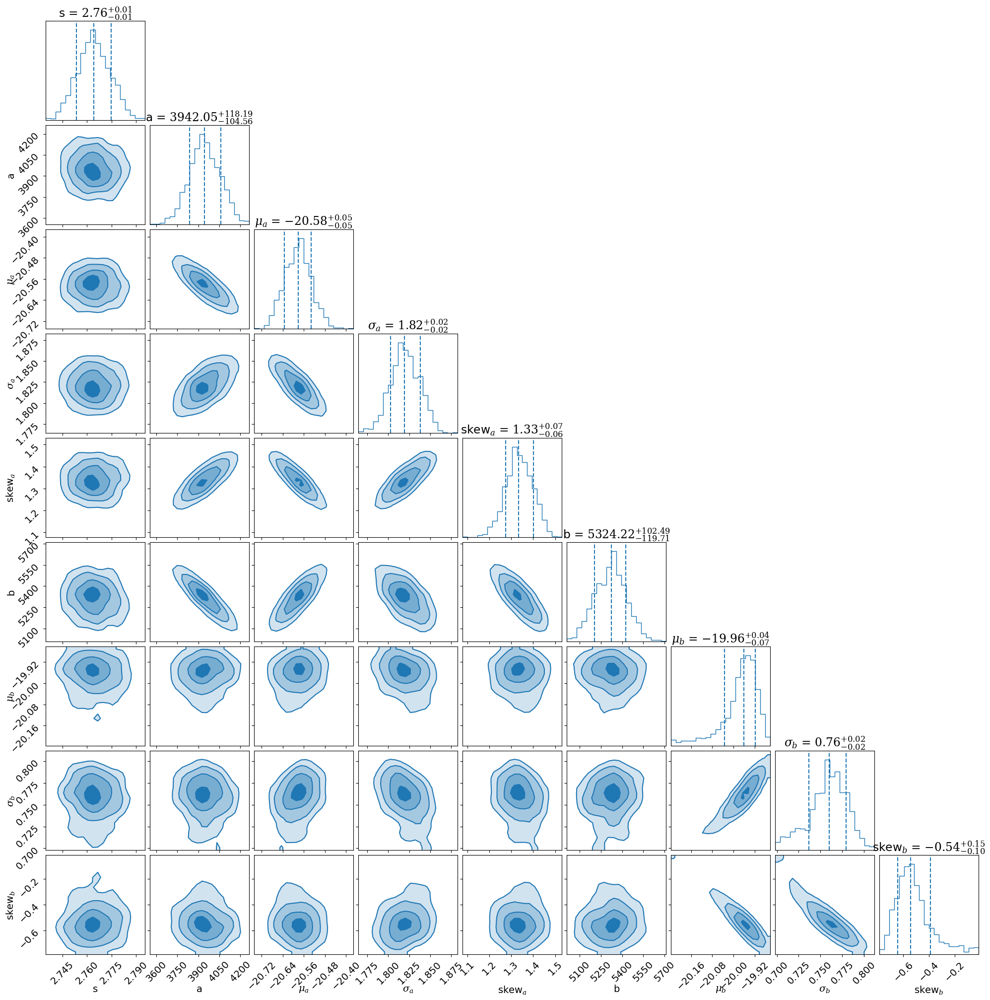

In [25]:
pc.plotting.corner(V2noRmin_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [26]:
lnzM1_V2noRmin = V2noRmin_results1['logz'][-1]
lnzM1_V2noRmin

-1902.5113203760452

In [27]:
V2noRmin_bestfit1 = np.median(V2noRmin_results1['samples'], axis=0)

V2noRmin_bestfit1

array([ 2.7639985e+00,  3.9420452e+03, -2.0582058e+01,  1.8193049e+00,
        1.3344089e+00,  5.3242246e+03, -1.9960865e+01,  7.6013434e-01,
       -5.4173529e-01], dtype=float32)

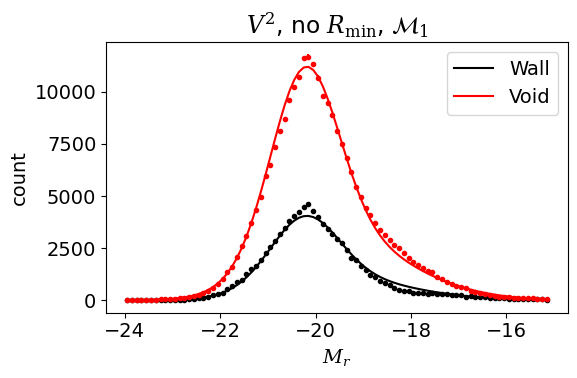

In [28]:
Model_1_plot(V2noRmin_bestfit1, 
             rabsmag_NSA[wall_noRmin], 
             rabsmag_NSA[void_noRmin], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [39]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2-noRmin(1).pickle', 'rb')
V2noRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

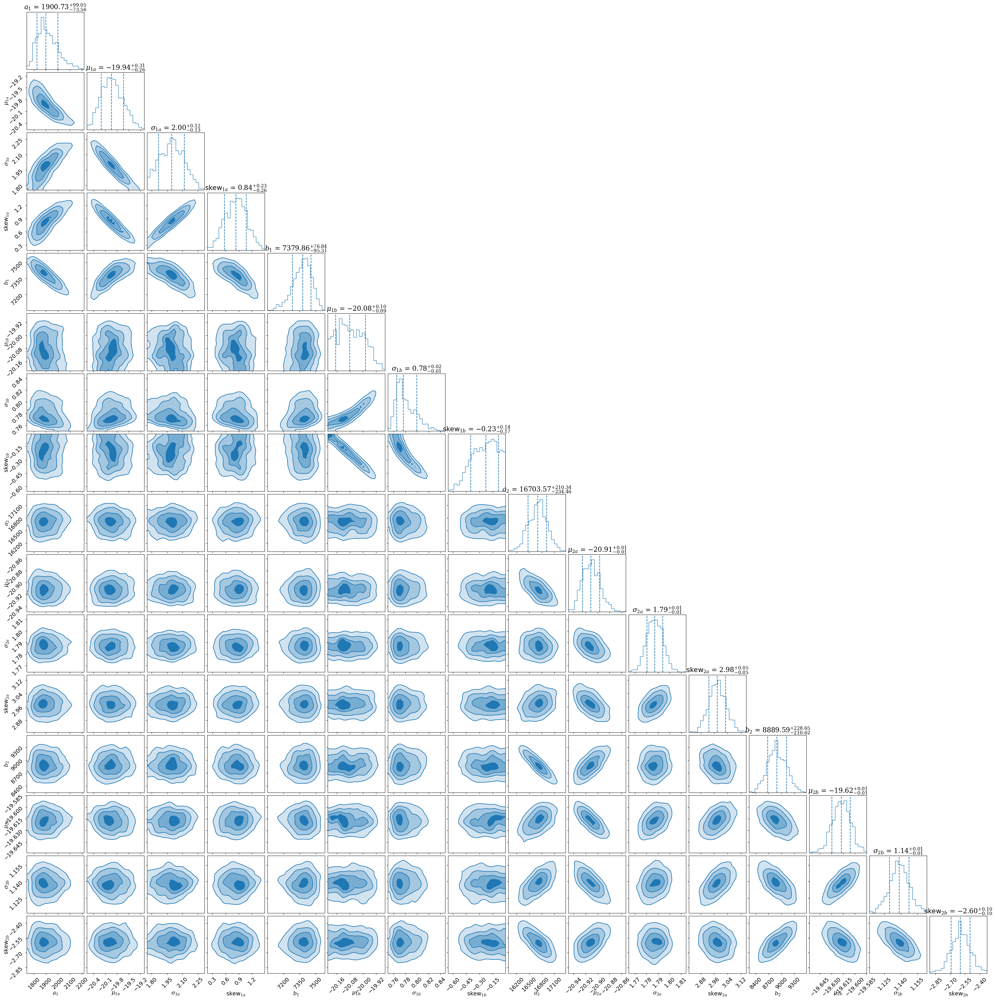

In [40]:
pc.plotting.corner(V2noRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [41]:
lnzM2_V2noRmin = V2noRmin_results2['logz'][-1]
lnzM2_V2noRmin

-1091.1004500927538

In [42]:
V2noRmin_bestfit2 = np.median(V2noRmin_results2['samples'], axis=0)

V2noRmin_bestfit2

array([ 1.9007349e+03, -1.9943199e+01,  1.9957681e+00,  8.3794916e-01,
        7.3798594e+03, -2.0081026e+01,  7.7657282e-01, -2.2847885e-01,
        1.6703572e+04, -2.0911102e+01,  1.7870365e+00,  2.9785419e+00,
        8.8895918e+03, -1.9617409e+01,  1.1385951e+00, -2.5961642e+00],
      dtype=float32)

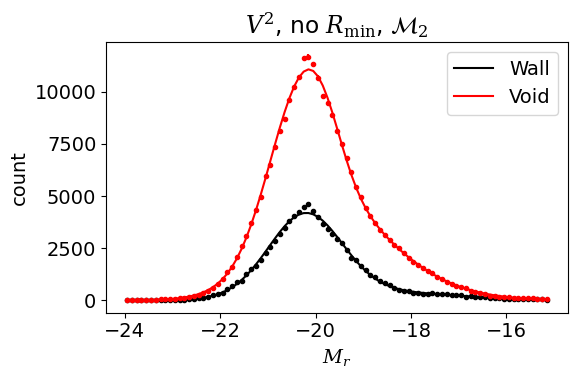

In [43]:
Model_2_plot(V2noRmin_bestfit2, 
             rabsmag_NSA[wall_noRmin], 
             rabsmag_NSA[void_noRmin], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [44]:
lnB12_V2noRmin = lnzM1_V2noRmin - lnzM2_V2noRmin

B12_V2noRmin = np.exp(lnB12_V2noRmin)

print('V2 (void v. wall) Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2noRmin, lnB12_V2noRmin*np.log10(np.exp(1))))

V2 (void v. wall) Mr: B12 = 0; log(B12) = -352.391


## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

#### Void v. wall

In [52]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2-0p1(1).pickle', 'rb')
V2_0p1_results1 = pickle.load(temp_infile)
temp_infile.close()

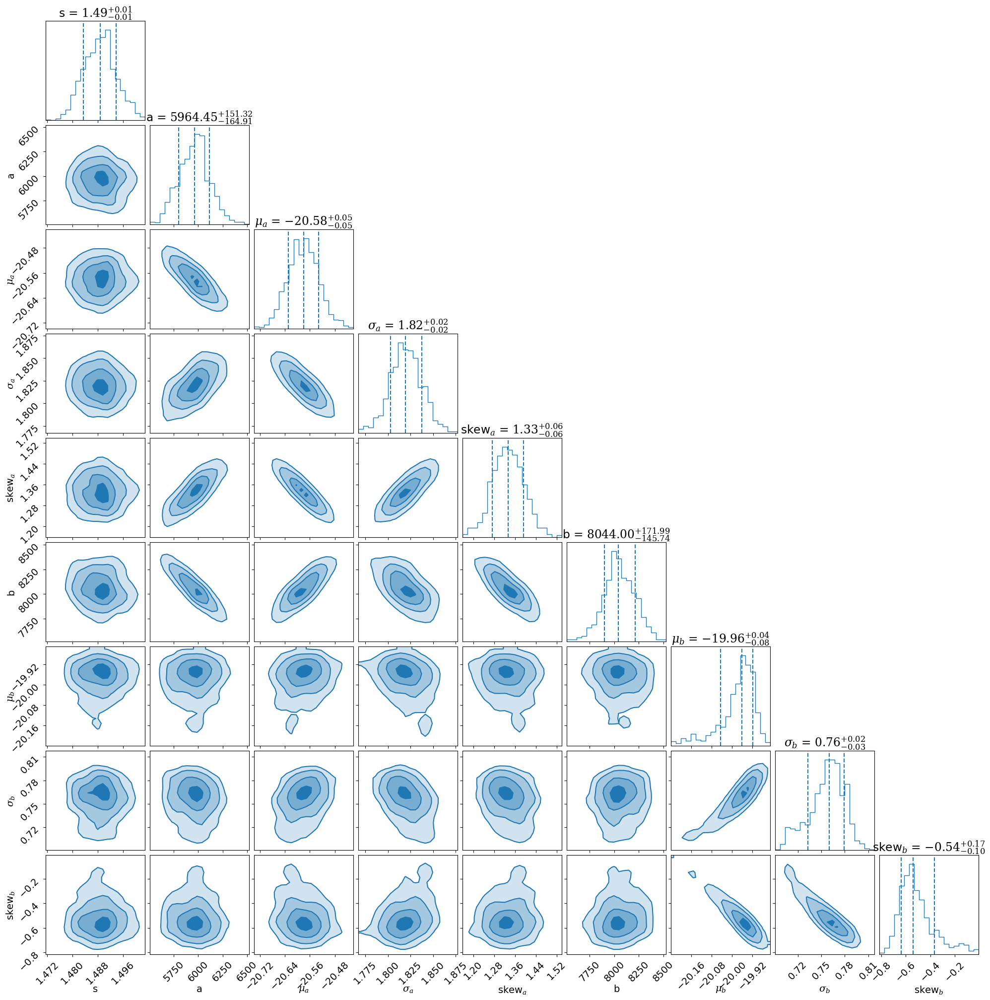

In [53]:
pc.plotting.corner(V2_0p1_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [54]:
lnzM1_V2_0p1 = V2_0p1_results1['logz'][-1]
lnzM1_V2_0p1

-1718.5177112472427

In [55]:
V2_0p1_bestfit1 = np.median(V2_0p1_results1['samples'], axis=0)

V2_0p1_bestfit1

array([ 1.4887301e+00,  5.9644502e+03, -2.0580345e+01,  1.8195496e+00,
        1.3341856e+00,  8.0440020e+03, -1.9961550e+01,  7.5994205e-01,
       -5.4086971e-01], dtype=float32)

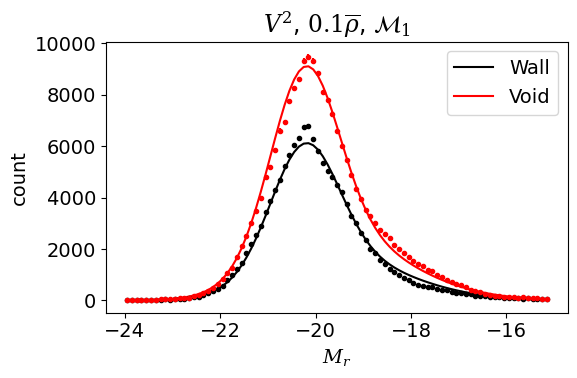

In [56]:
Model_1_plot(V2_0p1_bestfit1, 
             rabsmag_NSA[wall_0p1], 
             rabsmag_NSA[void_0p1], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [47]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2-0p1(1).pickle', 'rb')
V2_0p1_results2 = pickle.load(temp_infile)
temp_infile.close()

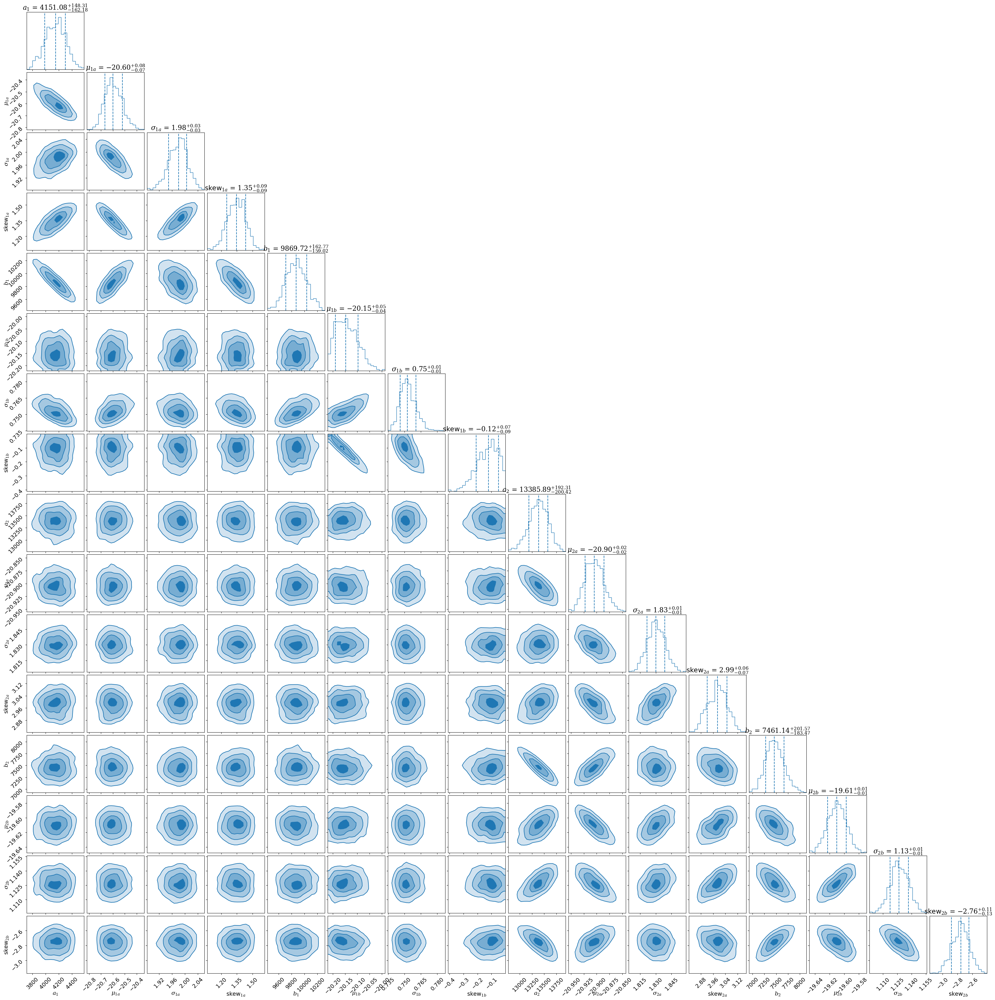

In [48]:
pc.plotting.corner(V2_0p1_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [49]:
lnzM2_V2_0p1 = V2_0p1_results2['logz'][-1]
lnzM2_V2_0p1

-1104.1797789327593

In [50]:
V2_0p1_bestfit2 = np.median(V2_0p1_results2['samples'], axis=0)

V2_0p1_bestfit2

array([ 4.1510820e+03, -2.0599453e+01,  1.9801676e+00,  1.3475847e+00,
        9.8697227e+03, -2.0147709e+01,  7.5256419e-01, -1.2148611e-01,
        1.3385891e+04, -2.0904718e+01,  1.8300633e+00,  2.9891629e+00,
        7.4611426e+03, -1.9610115e+01,  1.1268666e+00, -2.7557769e+00],
      dtype=float32)

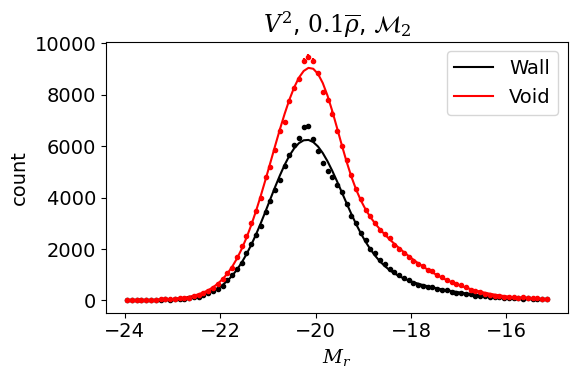

In [51]:
Model_2_plot(V2_0p1_bestfit2, 
             rabsmag_NSA[wall_0p1], 
             rabsmag_NSA[void_0p1], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [57]:
lnB12_V2_0p1 = lnzM1_V2_0p1 - lnzM2_V2_0p1

B12_V2_0p1 = np.exp(lnB12_V2_0p1)

print('V2 (void v. wall) Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p1, lnB12_V2_0p1*np.log10(np.exp(1))))

V2 (void v. wall) Mr: B12 = 1.57e-267; log(B12) = -266.804


## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

#### Void v. wall

In [58]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2-0p3(1).pickle', 'rb')
V2_0p3_results1 = pickle.load(temp_infile)
temp_infile.close()

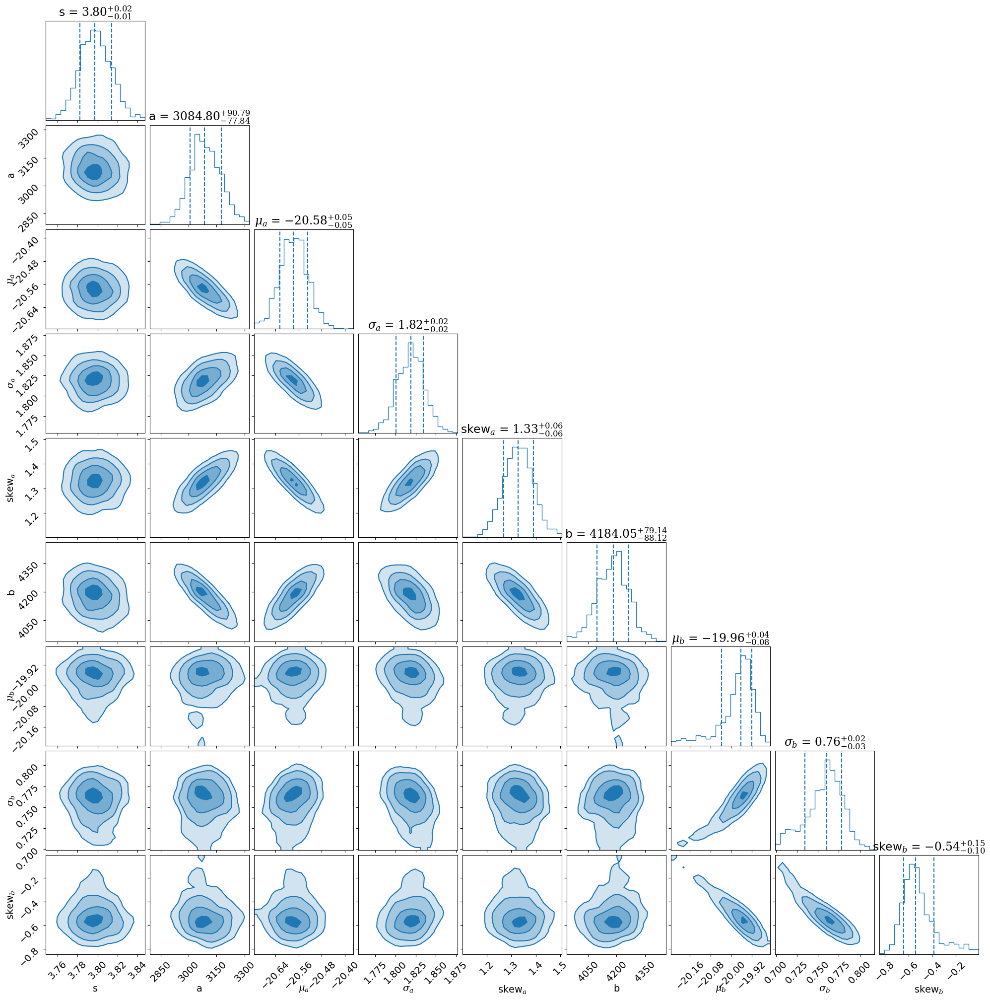

In [59]:
pc.plotting.corner(V2_0p3_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [60]:
lnzM1_V2_0p3 = V2_0p3_results1['logz'][-1]
lnzM1_V2_0p3

-1526.28659406216

In [61]:
V2_0p3_bestfit1 = np.median(V2_0p3_results1['samples'], axis=0)

V2_0p3_bestfit1

array([ 3.7974567e+00,  3.0847966e+03, -2.0577427e+01,  1.8189118e+00,
        1.3290222e+00,  4.1840522e+03, -1.9961086e+01,  7.6024151e-01,
       -5.4022205e-01], dtype=float32)

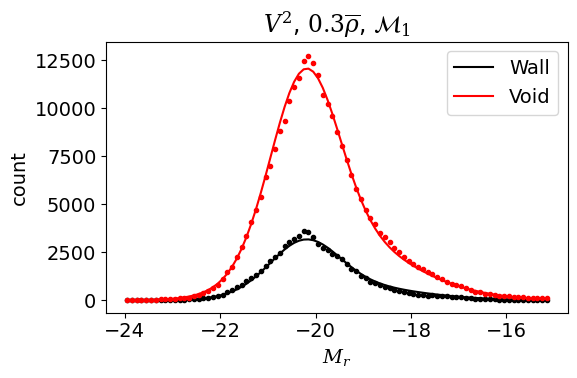

In [62]:
Model_1_plot(V2_0p3_bestfit1, 
             rabsmag_NSA[wall_0p3], 
             rabsmag_NSA[void_0p3], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [65]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2-0p3(1).pickle', 'rb')
V2_0p3_results2 = pickle.load(temp_infile)
temp_infile.close()

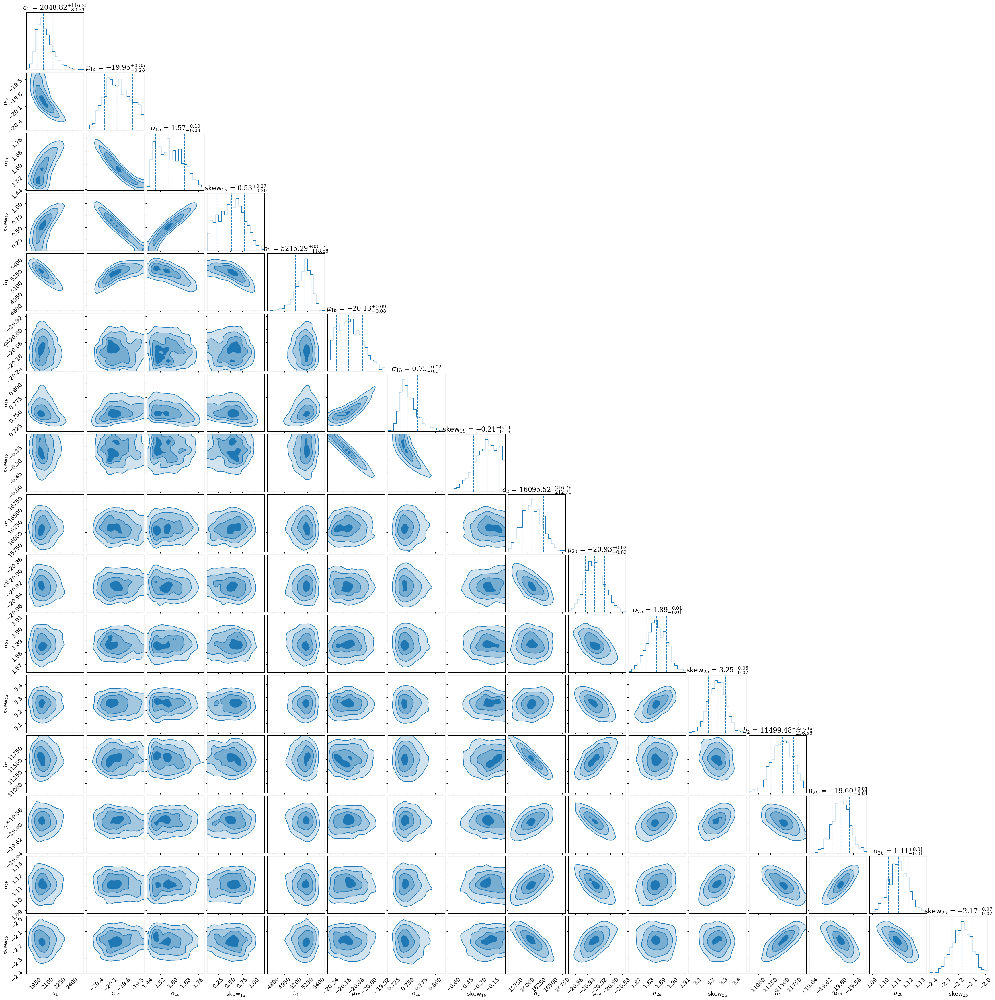

In [66]:
pc.plotting.corner(V2_0p3_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [67]:
lnzM2_V2_0p3 = V2_0p3_results2['logz'][-1]
lnzM2_V2_0p3

-1127.2586291750524

In [68]:
V2_0p3_bestfit2 = np.median(V2_0p3_results2['samples'], axis=0)

V2_0p3_bestfit2

array([ 2.0488232e+03, -1.9949722e+01,  1.5744748e+00,  5.2621782e-01,
        5.2152891e+03, -2.0126450e+01,  7.4876893e-01, -2.1452545e-01,
        1.6095516e+04, -2.0927431e+01,  1.8864219e+00,  3.2480643e+00,
        1.1499479e+04, -1.9596935e+01,  1.1119988e+00, -2.1739612e+00],
      dtype=float32)

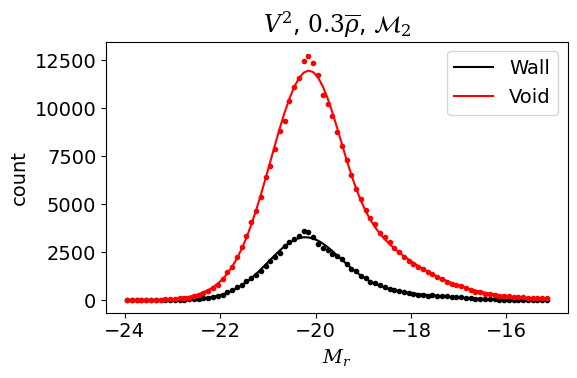

In [69]:
Model_2_plot(V2_0p3_bestfit2, 
             rabsmag_NSA[wall_0p3], 
             rabsmag_NSA[void_0p3], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [70]:
lnB12_V2_0p3 = lnzM1_V2_0p3 - lnzM2_V2_0p3

B12_V2_0p3 = np.exp(lnB12_V2_0p3)

print('V2 (void v. wall) Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p3, lnB12_V2_0p3*np.log10(np.exp(1))))

V2 (void v. wall) Mr: B12 = 5.06e-174; log(B12) = -173.296
